Cyna Shirazinejad, 7/7/21

# outline of notebook 9:

##### import all necessary Python modules

In [23]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle
from IPython.display import Image
unique_user_path_notebook = str(np.load('unique_user_path_notebook.npy'))
unique_user_saved_outputs = str(np.load('unique_user_saved_outputs.npy'))
sys.path.append(unique_user_path_notebook+'/cmeAnalysisPostProcessingPythonScripts') # add custom Python scripts to the local path
import generate_index_dictionary
import display_tracks
index_dictionary = generate_index_dictionary.return_index_dictionary()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# load files

In [24]:
df_merged_features = pd.read_csv(unique_user_saved_outputs+'/dataframes/df_new_incorporated_data_merged_features.zip')
df_pcs_normal_scaled_with_gmm_cluster = pd.read_csv(unique_user_saved_outputs+'/dataframes/df_new_incorporated_data_pcs_gmm_clusters.zip')

with open(unique_user_saved_outputs+'/dataframes/merged_ap2arpc3_data_zeropadding', 'rb') as f:
    merged_results = pickle.load(f)  

ccps_arpc3_negative = np.load(unique_user_saved_outputs+'/dataframes/ccps_arpc3_negative_zeropadding.npy', allow_pickle=True)
    
ccps_arpc3_positive = np.load(unique_user_saved_outputs+'/dataframes/ccps_arpc3_positive_zeropadding.npy', allow_pickle=True)
    
ap2_lifetime_arpc3_negative = merged_results['ap2_lifetime_arpc3_negative']
ap2_lifetime_arpc3_positive = np.array(merged_results['ap2_lifetime_arpc3_positive'])
time_ap2_appearance_to_dnm2_peak_arpc3_negative = merged_results['time_ap2_appearance_to_dnm2_peak_arpc3_negative']
time_ap2_appearance_to_dnm2_peak_arpc3_positive = np.array(merged_results['time_ap2_appearance_to_dnm2_peak_arpc3_positive'])
time_arpc3_appearance_to_dnm2_peak_arpc3_positive = np.array(merged_results['time_arpc3_appearance_to_dnm2_peak_arpc3_positive'])
arpc3_lifetime_arpc3_positive = np.array(merged_results['arpc3_lifetime_arpc3_positive'])

In [25]:
merged_results.keys()

dict_keys(['ch0_vectors_arpc3_positive', 'ch1_vectors_arpc3_positive', 'ch2_vectors_arpc3_positive', 'channel_0_1_separations_arpc3_positive', 'channel_0_2_separations_arpc3_positive', 'channel_1_2_separations_arpc3_positive', 'final_separations_ap2arpc3_arpc3_positive', 'initial_separations_ap2arpc3_arpc3_positive', 'ap2_arpc3_separation_at_dnm2_peak_arpc3_positive', 'ap2_arpc3_separation_at_arpc3_peak_arpc3_positive', 'ap2_arpc3_separation_at_ap2_peak_arpc3_positive', 'ap2_lifetime_arpc3_positive', 'arpc3_lifetime_arpc3_positive', 'max_separation_ap2_arpc3_arpc3_positive', 'max_separation_ap2_dnm2_arpc3_positive', 'max_separation_dnm2_arpc3_arpc3_positive', 'num_frames_associated_arpc3_positive', 'time_ap2_appearance_to_dnm2_peak_arpc3_positive', 'maximum_ap2_intensity_arpc3_positive', 'maximum_dnm2_intensity_arpc3_positive', 'maximum_arpc3_intensity_arpc3_positive', 'pval_arpc3_ccps_arpc3_positive', 'time_arpc3_appearance_to_dnm2_peak_arpc3_positive', 'fraction_arpc3_positive', 'ccp

# merge amplitudes of different channels

In [26]:
channel_amplitudes_arpc3_negative = []
for i in range(len(merged_results['ch0_vectors_arpc3_negative'])):
    channel_amplitudes_arpc3_negative.append([merged_results['ch0_vectors_arpc3_negative'][i],
                                              merged_results['ch1_vectors_arpc3_negative'][i],
                                              merged_results['channel_0_1_separations_arpc3_negative'][i]])
    
channel_amplitudes_arpc3_positive = []
for i in range(len(merged_results['ch0_vectors_arpc3_positive'])):
    channel_amplitudes_arpc3_positive.append([merged_results['ch0_vectors_arpc3_positive'][i],
                                              merged_results['ch1_vectors_arpc3_positive'][i],
                                              merged_results['ch2_vectors_arpc3_positive'][i],
                                              merged_results['channel_0_1_separations_arpc3_positive'][i],
                                              merged_results['channel_0_2_separations_arpc3_positive'][i]])

# aligned AP2/DNM2 intensities to DNM2 peaks, stacked, for ARPC3- CCPs

In [27]:
%%capture

plt.rcParams['axes.spines.right'] = True

fig, axes = plt.subplots(1, 1, dpi=500, figsize=(15,5))
cohorts = [[min(ap2_lifetime_arpc3_negative),40],[40,60],[60,80],[80,max(ap2_lifetime_arpc3_negative)]]

display_tracks.plot_cohorts_centered_on_aligned_channel([axes], 
                                         channel_amplitudes_arpc3_negative[:-1], 
                                         1, 
                                         cohorts, 
                                         [0, 1], 
                                         [], 
                                         ['AP2', 'DNM2'],
                                         ['m', 'g'])
plt.xlabel('time (s)')
plt.ylabel('a.u. fluorescence')
plt.xlim(-30,20);
plt.ylim(0,600);
plt.title('ARPC3- events aligned to peak of DNM2\ncohort: <40, 40-60, 60-80, >80 seconds');
plt.legend()
plt.savefig(unique_user_saved_outputs+'/plots/arpc3minus_cohorts_centered_on_single_dnm2_max_spot_zeropadding.png')

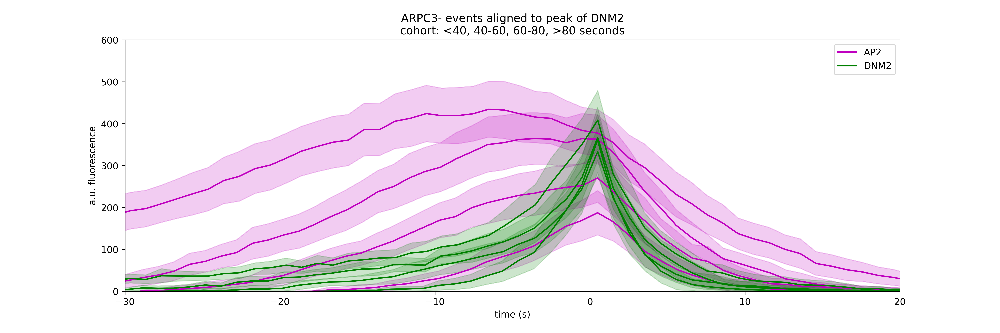

In [28]:
Image(filename=unique_user_saved_outputs+'/plots/arpc3minus_cohorts_centered_on_single_dnm2_max_spot_zeropadding.png', height=500, width=500)

# aligned AP2/DNM2/ARPC3 intensities to DNM2 peaks, stacked, for ARPC3+ CCPs

In [29]:
%%capture
fig, axes = plt.subplots(1, 1, dpi=500, figsize=(15,5))
cohorts = [[min(ap2_lifetime_arpc3_negative),40],[40,60],[60,80],[80,max(ap2_lifetime_arpc3_negative)]]

display_tracks.plot_cohorts_centered_on_aligned_channel([axes], 
                                         channel_amplitudes_arpc3_positive[:-2], 
                                         1, 
                                         cohorts, 
                                         [0, 1, 2], 
                                         [], 
                                         ['AP2', 'DNM2', 'ARPC3'],
                                         ['m', 'g', 'b'])

plt.xlabel('time (s)')
plt.ylabel('a.u. fluorescence')
plt.xlim(-30,20);
plt.ylim(0,600);
plt.title('ARPC3+ events aligned to peak of DNM2\ncohort: <40, 40-60, 60-80, >80 seconds');
plt.legend()
plt.savefig(unique_user_saved_outputs+'/plots/arpc3plus_cohorts_centered_on_single_dnm2_max_spot_zeropadding.png')

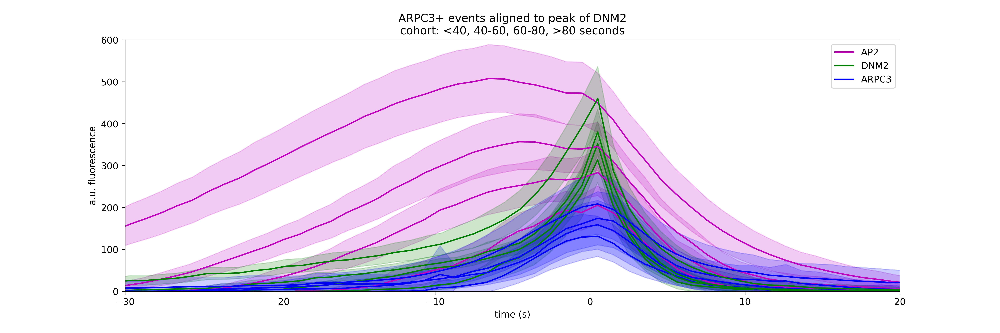

In [30]:
Image(filename=unique_user_saved_outputs+'/plots/arpc3plus_cohorts_centered_on_single_dnm2_max_spot_zeropadding.png', height=500, width=500)

# cohort plots of ARPC3- CCPs

In [31]:
%%capture

plt.style.use('default')

fig, axes = plt.subplots(1, 1, dpi=500, figsize=(15,5))


cohorts = [[min(ap2_lifetime_arpc3_negative),40],[40,60],[60,80],[80,max(ap2_lifetime_arpc3_negative)]]

offsets, num_in_cohort, _ = display_tracks.plot_separated_cohorts([axes], 
                                                   channel_amplitudes_arpc3_negative[:-1], 
                                                   1, 
                                                   cohorts, 
                                                   [0, 1], 
                                                   [], 
                                                   ['AP2', 'DNM2'],
                                                   ['m', 'g'])


lines_0, labels_0 = axes.get_legend_handles_labels()
axes.legend(lines_0, labels_0, 
            loc='upper center', 
            bbox_to_anchor=(0.88, 0.8), 
            title="{:,}".format(len(channel_amplitudes_arpc3_negative)) + ' total events')
# plt.legend(loc='upper center', bbox_to_anchor=(0.88, 0.8), title="{:,}".format(len(channel_amplitudes_arpc3_negative)) + ' total events')

y_lines = np.arange(0,600,100)

for i in range(1,len(y_lines)):
    
    axes.axhline(y_lines[i], 0, 1, linestyle='--', color='black', alpha=0.2)

text_horizontal_shifts = 3
text_percentage_y = 460
text_bounds_y = 480

for i in range(len(cohorts)):

    if i==0:
        axes.text(text_horizontal_shifts, text_bounds_y, '$\mathregular{lifetime <}$'+str(cohorts[i][1])+' s', fontsize=8)
        axes.text(text_horizontal_shifts, text_percentage_y, "{:.2f}".format(100*num_in_cohort[i]/len(channel_amplitudes_arpc3_negative)) + '%')
    elif i==len(cohorts)-1:
        axes.text(offsets[i]+text_horizontal_shifts, text_bounds_y, '$\mathregular{lifetime >}$'+str(cohorts[i][0])+' s', fontsize=8)
        axes.text(offsets[i]+text_horizontal_shifts, text_percentage_y, "{:.2f}".format(100*num_in_cohort[i]/len(channel_amplitudes_arpc3_negative)) + '%')
    else:
        axes.text(offsets[i]+text_horizontal_shifts, text_bounds_y, str(cohorts[i][0])+'$\mathregular{s \leq lifetime <}$'+str(cohorts[i][1])+' s', fontsize=8)
        axes.text(offsets[i]+text_horizontal_shifts, text_percentage_y, "{:.2f}".format(100*num_in_cohort[i]/len(channel_amplitudes_arpc3_negative)) + '%')

x_labels = []
num_ticks = 0
for cohort in cohorts:
    x_labels+=list(range(0,cohort[1]-10+1,10))
    num_ticks += int(cohort[1]/10)+1
        
axes.set_xticks(np.linspace(0,360,len(x_labels)), minor=False)
axes.set_xticklabels(x_labels, minor=False)
axes.set_xlabel('time (s)') 
axes.set_ylabel('a.u. fluorescence')
axes.set_title('ARPC3- CCPs, aligned to DNM2 peaks, binned in cohorts by AP2 lifetimes')
axes.set_xlim([0,offsets[-1]+cohorts[-1][-1]])    
axes.set_ylim([0,530])  
plt.tight_layout()   
plt.savefig(unique_user_saved_outputs+'/plots/all_overlaid_ap2dnm2_arpc3minusccps_cohorts_zeropadding.png')

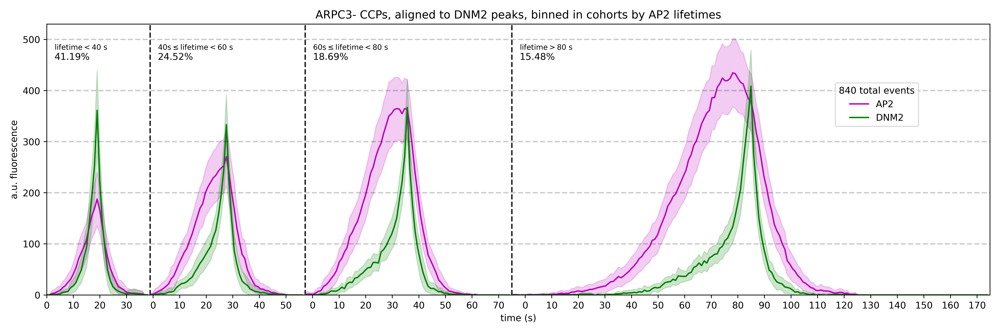

In [32]:
Image(filename=unique_user_saved_outputs+'/plots/all_overlaid_ap2dnm2_arpc3minusccps_cohorts_zeropadding.png', height=500, width=500)

In [33]:
%%capture

plt.style.use('default')

fig, axes = plt.subplots(1, 1, dpi=500, figsize=(15,5))


cohorts = [[min(ap2_lifetime_arpc3_negative),40],[40,60],[60,80],[80,max(ap2_lifetime_arpc3_negative)]]

offsets, num_in_cohort, max_dnm2_cohort_indices = display_tracks.plot_separated_cohorts([axes], 
                                                                         channel_amplitudes_arpc3_negative[:-1], 
                                                                         1, 
                                                                         cohorts, 
                                                                         [0, 1], 
                                                                         [], 
                                                                         ['AP2', 'DNM2'],
                                                                         ['m', 'g'])

lines_0, labels_0 = axes.get_legend_handles_labels()
axes.legend(lines_0, labels_0, 
            loc='upper center', 
            bbox_to_anchor=(0.88, 0.8), 
            title="{:,}".format(len(channel_amplitudes_arpc3_negative)) + ' total events')

y_lines = np.arange(0,600,100)

for i in range(1,len(y_lines)):
    
    axes.axhline(y_lines[i], 0, 1, linestyle='--', color='black', alpha=0.2)

text_horizontal_shifts = 3
text_percentage_y = 460
text_bounds_y = 480

for i in range(len(cohorts)):

    if i==0:
        axes.text(text_horizontal_shifts, text_bounds_y, '$\mathregular{lifetime <}$'+str(cohorts[i][1])+' s', fontsize=8)
        axes.text(text_horizontal_shifts, text_percentage_y, "{:.2f}".format(100*num_in_cohort[i]/len(channel_amplitudes_arpc3_negative)) + '%')
    elif i==len(cohorts)-1:
        axes.text(offsets[i]+text_horizontal_shifts, text_bounds_y, '$\mathregular{lifetime >}$'+str(cohorts[i][0])+' s', fontsize=8)
        axes.text(offsets[i]+text_horizontal_shifts, text_percentage_y, "{:.2f}".format(100*num_in_cohort[i]/len(channel_amplitudes_arpc3_negative)) + '%')
    else:
        axes.text(offsets[i]+text_horizontal_shifts, text_bounds_y, str(cohorts[i][0])+'$\mathregular{s \leq lifetime <}$'+str(cohorts[i][1])+' s', fontsize=8)
        axes.text(offsets[i]+text_horizontal_shifts, text_percentage_y, "{:.2f}".format(100*num_in_cohort[i]/len(channel_amplitudes_arpc3_negative)) + '%')
        
x_positions_ticks = []
x_labels_ticks = []
max_ticks_per_cohort = [[1, 1], [2, 2], [3, 3], [6, 3]]

for i in range(len(max_dnm2_cohort_indices)):
    

    num_ticks_before = np.min((int(np.floor((max_dnm2_cohort_indices[i])/10)),max_ticks_per_cohort[i][0]))
    num_ticks_after = np.min((int(np.ceil((cohorts[i][1]-max_dnm2_cohort_indices[i])/10)-1),max_ticks_per_cohort[i][1]))
    for j in range(num_ticks_before):
        
        x_labels_ticks.append(-10*(j+1))
        x_positions_ticks.append(-10*(j+1) + offsets[i] + max_dnm2_cohort_indices[i])
    
    x_labels_ticks.append(0)
    x_positions_ticks.append(offsets[i] + max_dnm2_cohort_indices[i])
    
    for j in range(num_ticks_after):
        
        x_labels_ticks.append(10*(j+1))
        x_positions_ticks.append(10*(j+1) + offsets[i] + max_dnm2_cohort_indices[i])


axes.set_xticks(0.5+np.array(x_positions_ticks), minor=False)
axes.set_xticklabels(x_labels_ticks, minor=False)


axes.set_xlabel('time (s)') 
axes.set_ylabel('a.u. fluorescence')
axes.set_title('ARPC3- CCPs, aligned to DNM2 peaks, binned in cohorts by AP2 lifetimes')
axes.set_xlim([0,offsets[-1]+cohorts[-1][-1]])    
axes.set_ylim([0,530])  
plt.tight_layout()   
plt.savefig(unique_user_saved_outputs+'/plots/all_overlaid_ap2dnm2_arpc3minusccps_cohorts_centered_zero_zeropadding.png')

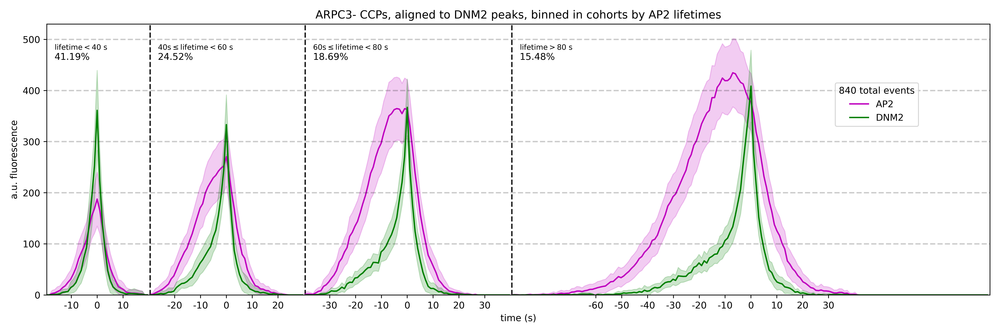

In [34]:
Image(filename=unique_user_saved_outputs+'/plots/all_overlaid_ap2dnm2_arpc3minusccps_cohorts_centered_zero_zeropadding.png', height=500, width=500)

# ARPC3- cohorts with AP2/DNM2 separation

In [35]:
%%capture

plt.style.use('default')
plt.rcParams['axes.spines.right'] = False

fig, axes = plt.subplots(1, 1, dpi=500, figsize=(7,5))
axes_separation = axes.twinx()

cohorts = [[min(ap2_lifetime_arpc3_negative), max(ap2_lifetime_arpc3_negative)]]

offsets, num_in_cohort, max_dnm2_cohort_indices = display_tracks.plot_separated_cohorts([axes, axes_separation], 
                                                                         channel_amplitudes_arpc3_negative, 
                                                                         1, 
                                                                         cohorts, 
                                                                         [0, 1], 
                                                                         [2], 
                                                                         ['AP2', 'DNM2', 'AP2-DNM2'],
                                                                         ['m', 'g', 'g'],
                                                                         line_cutoff_index=[2],
                                                                         line_cutoff_regions=[[], [], [[0, 92-5], [92+5, 120]]])

lines_0, labels_0 = axes.get_legend_handles_labels()
lines_1, labels_1 = axes_separation.get_legend_handles_labels()
axes.legend(lines_0+lines_1, labels_0+labels_1, 
            loc='upper right',
            title="{:,}".format(len(channel_amplitudes_arpc3_negative)) + ' total events')
y_lines = np.arange(0,600,100)

for i in range(1,len(y_lines)):
    
    axes.axhline(y_lines[i], 0, 1, linestyle='--', color='black', alpha=0.2)


x_positions_ticks = []
x_labels_ticks = []
max_ticks_per_cohort = [[3, 2]]

for i in range(len(max_dnm2_cohort_indices)):
    

    num_ticks_before = np.min((int(np.floor((max_dnm2_cohort_indices[i])/10)),max_ticks_per_cohort[i][0]))
    num_ticks_after = np.min((int(np.ceil((cohorts[i][1]-max_dnm2_cohort_indices[i])/10)-1),max_ticks_per_cohort[i][1]))
    
    for j in range(num_ticks_before):
        
        x_labels_ticks.append(-10*(j+1))
        x_positions_ticks.append(-10*(j+1) + offsets[i] + max_dnm2_cohort_indices[i])
    
    x_labels_ticks.append(0)
    x_positions_ticks.append(offsets[i] + max_dnm2_cohort_indices[i])
    
    for j in range(num_ticks_after):
        
        x_labels_ticks.append(10*(j+1))
        x_positions_ticks.append(10*(j+1) + offsets[i] + max_dnm2_cohort_indices[i])


axes.set_xticks(0.5+np.array(x_positions_ticks), minor=False)
axes.set_xticklabels(x_labels_ticks, minor=False)


axes.set_xlabel('time (s)') 
axes.set_ylabel('a.u. fluorescence')
axes.set_title('ARPC3- CCPs, aligned to DNM2 peaks, binned in cohorts by AP2 lifetimes')
axes.set_xlim([50,120])    
axes.set_ylim([0,530])
axes_separation.set_ylim([0,0.5])
axes_separation.set_ylabel('separation (microns)')
axes.axvline(120, color='black', linewidth=5, linestyle='--')
plt.tight_layout()   
plt.savefig(unique_user_saved_outputs+'/plots/all_overlaid_ap2dnm2_arpc3minusccps_cohorts_overlaid_separation_zeropadding.png')

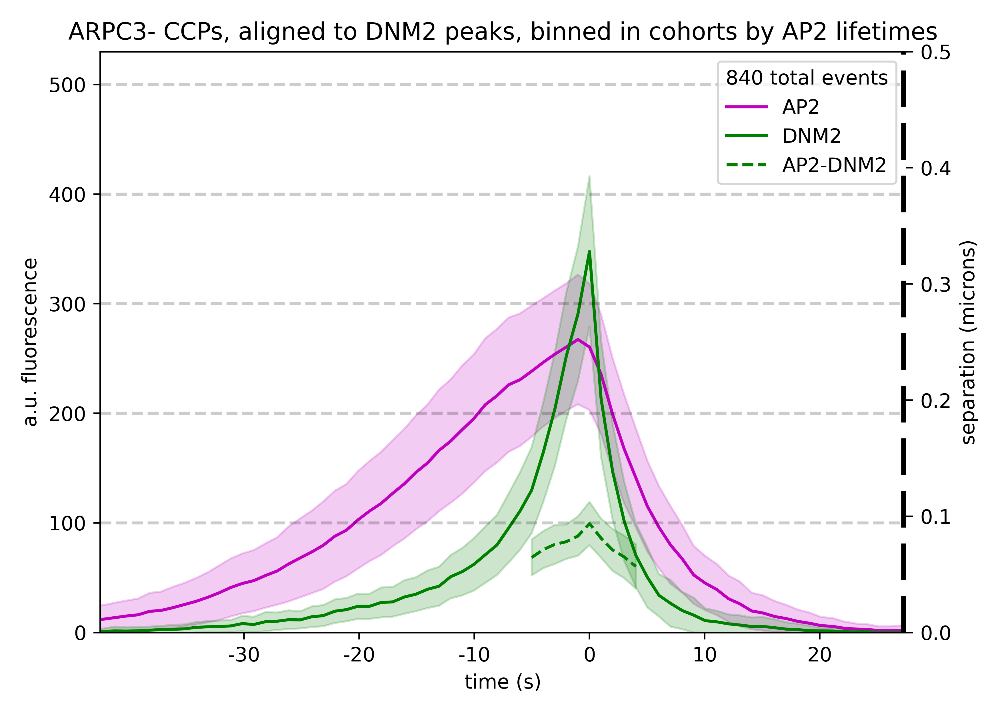

In [36]:
Image(filename=unique_user_saved_outputs+'/plots/all_overlaid_ap2dnm2_arpc3minusccps_cohorts_overlaid_separation_zeropadding.png', height=500, width=500)

# cohort plots of ARPC3+ CCPs

In [37]:
%%capture

plt.style.use('default')

fig, axes = plt.subplots(1, 1, dpi=500, figsize=(15,5))
# axes_separation = axes.twinx()

cohorts = [[min(ap2_lifetime_arpc3_positive),40],[40,60],[60,80],[80,max(ap2_lifetime_arpc3_positive)]]

offsets, num_in_cohort, max_dnm2_cohort_indices = display_tracks.plot_separated_cohorts([axes, axes_separation], 
                                                                         channel_amplitudes_arpc3_positive, 
                                                                         1, 
                                                                         cohorts, 
                                                                         [0, 1, 2], 
                                                                         [], 
                                                                         ['AP2', 'DNM2', 'ARPC3'],
                                                                         ['m', 'g', 'b'])

lines_0, labels_0 = axes.get_legend_handles_labels()
axes.legend(lines_0, labels_0, 
            loc='upper center', 
            bbox_to_anchor=(0.88, 0.8), 
            title="{:,}".format(len(channel_amplitudes_arpc3_positive)) + ' total events')

y_lines = np.arange(0,600,100)

for i in range(1,len(y_lines)):
    
    axes.axhline(y_lines[i], 0, 1, linestyle='--', color='black', alpha=0.2)

text_horizontal_shifts = 3
text_percentage_y = 540
text_bounds_y = 560

for i in range(len(cohorts)):

    if i==0:
        axes.text(text_horizontal_shifts, text_bounds_y, '$\mathregular{lifetime <}$'+str(cohorts[i][1])+' s', fontsize=8)
        axes.text(text_horizontal_shifts, text_percentage_y, "{:.2f}".format(100*num_in_cohort[i]/len(channel_amplitudes_arpc3_positive)) + '%')
    elif i==len(cohorts)-1:
        axes.text(offsets[i]+text_horizontal_shifts, text_bounds_y, '$\mathregular{lifetime >}$'+str(cohorts[i][0])+' s', fontsize=8)
        axes.text(offsets[i]+text_horizontal_shifts, text_percentage_y, "{:.2f}".format(100*num_in_cohort[i]/len(channel_amplitudes_arpc3_positive)) + '%')
    else:
        axes.text(offsets[i]+text_horizontal_shifts, text_bounds_y, str(cohorts[i][0])+'$\mathregular{s \leq lifetime <}$'+str(cohorts[i][1])+' s', fontsize=8)
        axes.text(offsets[i]+text_horizontal_shifts, text_percentage_y, "{:.2f}".format(100*num_in_cohort[i]/len(channel_amplitudes_arpc3_positive)) + '%')
        
x_positions_ticks = []
x_labels_ticks = []
max_ticks_per_cohort = [[1, 1], [2, 2], [3, 3], [6, 3]]

for i in range(len(max_dnm2_cohort_indices)):
    

    num_ticks_before = np.min((int(np.floor((max_dnm2_cohort_indices[i])/10)),max_ticks_per_cohort[i][0]))
    num_ticks_after = np.min((int(np.ceil((cohorts[i][1]-max_dnm2_cohort_indices[i])/10)-1),max_ticks_per_cohort[i][1]))
    for j in range(num_ticks_before):
        
        x_labels_ticks.append(-10*(j+1))
        x_positions_ticks.append(-10*(j+1) + offsets[i] + max_dnm2_cohort_indices[i])
    
    x_labels_ticks.append(0)
    x_positions_ticks.append(offsets[i] + max_dnm2_cohort_indices[i])
    
    for j in range(num_ticks_after):
        
        x_labels_ticks.append(10*(j+1))
        x_positions_ticks.append(10*(j+1) + offsets[i] + max_dnm2_cohort_indices[i])


axes.set_xticks(0.5+np.array(x_positions_ticks), minor=False)
axes.set_xticklabels(x_labels_ticks, minor=False)


axes.set_xlabel('time (s)') 
axes.set_ylabel('a.u. fluorescence')
axes.set_title('ARPC3+ CCPs, aligned to DNM2 peaks, binned in cohorts by AP2 lifetimes')
axes.set_xlim([0,offsets[-1]+cohorts[-1][-1]])    
axes.set_ylim([0,600])  
# axes_separation.set_ylim([0,.3])
plt.tight_layout()   
plt.savefig(unique_user_saved_outputs+'/plots/all_overlaid_ap2dnm2_arpc3plusccps_cohorts_centered_zero_zeropadding.png')

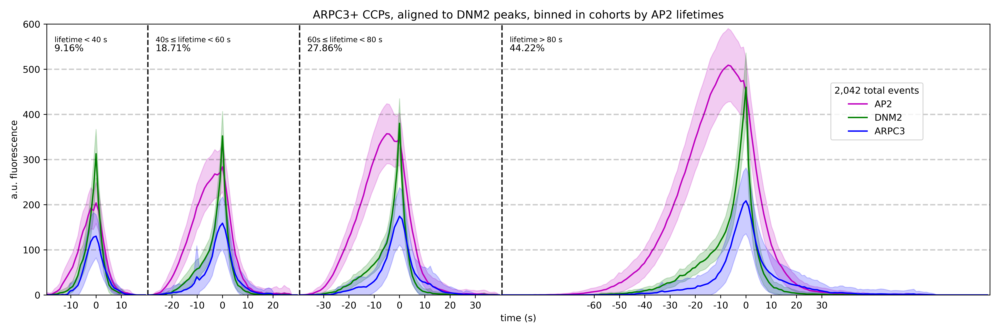

In [38]:
Image(filename=unique_user_saved_outputs+'/plots/all_overlaid_ap2dnm2_arpc3plusccps_cohorts_centered_zero_zeropadding.png', height=500, width=500)

# ARPC3+ cohort with AP2/DNM2 and AP2/ARPC3 separation

In [39]:
%%capture

plt.style.use('default')
plt.rcParams['axes.spines.right'] = False

fig, axes = plt.subplots(1, 1, dpi=500, figsize=(6,4))
axes_separation = axes.twinx()

cohorts = [[min(ap2_lifetime_arpc3_positive), max(ap2_lifetime_arpc3_positive)]]

offsets, num_in_cohort, max_dnm2_cohort_indices = display_tracks.plot_separated_cohorts([axes, axes_separation], 
                                                                         channel_amplitudes_arpc3_positive, 
                                                                         1, 
                                                                         cohorts, 
                                                                         [0, 1, 2], 
                                                                         [3, 4], 
                                                                         ['AP2', 'DNM2', 'ARPC3', 'AP2-DNM2', 'AP2-ARPC3'],
                                                                         ['m', 'g', 'b', 'g', 'b'],
                                                                         line_cutoff_index=[3, 4],
                                                                         line_cutoff_regions=[[], [], [], [[0, 96-10], [96+5, 120]], [[0, 96-10], [96+5, 120]]])

lines_0, labels_0 = axes.get_legend_handles_labels()
lines_1, labels_1 = axes_separation.get_legend_handles_labels()
axes.legend(lines_0+lines_1, labels_0+labels_1, 
            loc='upper right',
            title="{:,}".format(len(channel_amplitudes_arpc3_positive)) + ' total events')
y_lines = np.arange(0,600,100)

for i in range(1,len(y_lines)):
    
    axes.axhline(y_lines[i], 0, 1, linestyle='--', color='black', alpha=0.2)


x_positions_ticks = []
x_labels_ticks = []
max_ticks_per_cohort = [[3, 2]]

for i in range(len(max_dnm2_cohort_indices)):
    

    num_ticks_before = np.min((int(np.floor((max_dnm2_cohort_indices[i])/10)),max_ticks_per_cohort[i][0]))
    num_ticks_after = np.min((int(np.ceil((cohorts[i][1]-max_dnm2_cohort_indices[i])/10)-1),max_ticks_per_cohort[i][1]))
    
    for j in range(num_ticks_before):
        
        x_labels_ticks.append(-10*(j+1))
        x_positions_ticks.append(-10*(j+1) + offsets[i] + max_dnm2_cohort_indices[i])
    
    x_labels_ticks.append(0)
    x_positions_ticks.append(offsets[i] + max_dnm2_cohort_indices[i])
    
    for j in range(num_ticks_after):
        
        x_labels_ticks.append(10*(j+1))
        x_positions_ticks.append(10*(j+1) + offsets[i] + max_dnm2_cohort_indices[i])


axes.set_xticks(0.5+np.array(x_positions_ticks), minor=False)
axes.set_xticklabels(x_labels_ticks, minor=False)


axes.set_xlabel('time (s)') 
axes.set_ylabel('a.u. fluorescence')
axes.set_title('ARPC3+ CCPs, aligned to DNM2 peaks')
axes.set_xlim([50,120])    
axes.set_ylim([0,530])
axes_separation.set_ylim([0,0.5])
axes_separation.set_ylabel('separation (microns)')
axes.axvline(120, color='black', linewidth=5, linestyle='--')
plt.tight_layout()   
plt.savefig(unique_user_saved_outputs+'/plots/all_overlaid_ap2dnm2_arpc3plusccps_cohorts_overlaid_separation_zeropadding.png')

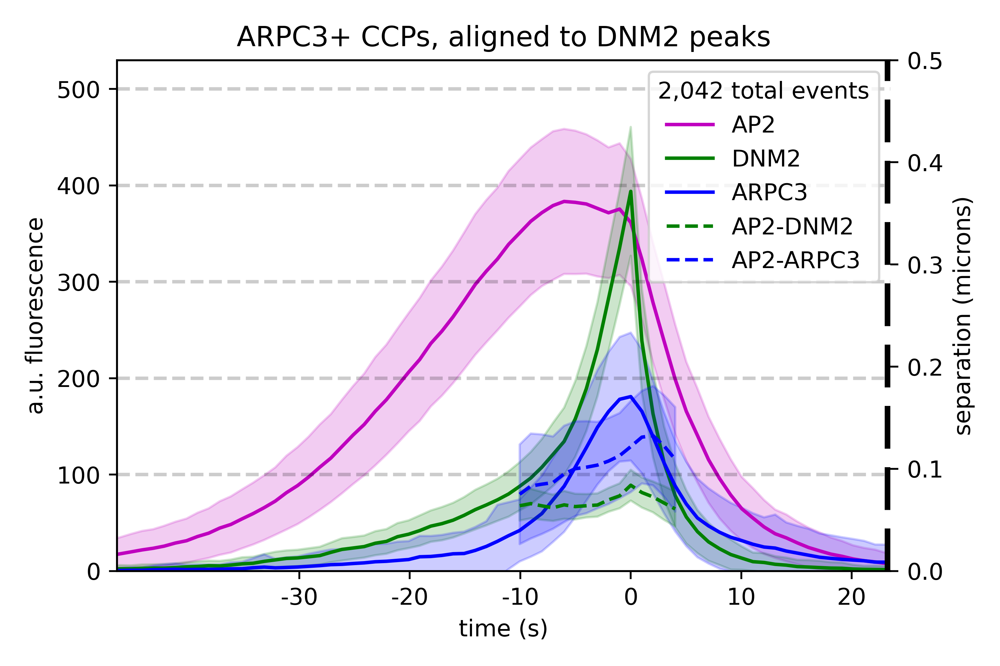

In [40]:
Image(filename=unique_user_saved_outputs+'/plots/all_overlaid_ap2dnm2_arpc3plusccps_cohorts_overlaid_separation_zeropadding.png', height=500, width=500)

# comparing ARPC3+/- aligned intensities

In [41]:
%%capture

plt.style.use('default')
plt.rcParams['axes.spines.right'] = True

fig, (axes_0, axes_1) = plt.subplots(2, 1, dpi=500, figsize=(6,8), gridspec_kw=dict(height_ratios=[1,1]))


cohorts = [[min(ap2_lifetime_arpc3_positive), max(ap2_lifetime_arpc3_positive)]]

_, _, max_dnm2_cohort_indices_0 = display_tracks.plot_separated_cohorts([axes_0], 
                                                                         channel_amplitudes_arpc3_positive, 
                                                                         1, 
                                                                         cohorts, 
                                                                         [0, 1, 2], 
                                                                         [], 
                                                                         ['AP2', 'DNM2', 'ARPC3'],
                                                                         ['m', 'g', 'b'],
                                                                         line_cutoff_index=[],
                                                                         line_cutoff_regions=[[], [], [], [], []],
                                                                         horizontal_shift_index=[0, 1, 2], 
                                                                         horizontal_shift=[-96, -96, -96])


cohorts = [[min(ap2_lifetime_arpc3_negative), max(ap2_lifetime_arpc3_negative)]]

offsets, num_in_cohort, max_dnm2_cohort_indices_1 = display_tracks.plot_separated_cohorts([axes_1], 
                                                                         channel_amplitudes_arpc3_negative, 
                                                                         1, 
                                                                         cohorts, 
                                                                         [0, 1], 
                                                                         [], 
                                                                         ['AP2', 'DNM2'],
                                                                         ['m', 'g'],
                                                                         line_cutoff_index=[],
                                                                         line_cutoff_regions=[[], [], []],
                                                                         horizontal_shift_index=[0, 1], 
                                                                         horizontal_shift=[-92, -92])                                                                           


lines_0, labels_0 = axes_0.get_legend_handles_labels()
# lines_1, labels_1 = axes_separation_0.get_legend_handles_labels()

axes_0.legend(lines_0, labels_0, 
            loc='upper right')

y_lines = np.arange(0,600,100)

for i in range(1,len(y_lines)):
    
    axes_0.axhline(y_lines[i], 0, 1, linestyle='--', color='black', alpha=0.2)
    axes_1.axhline(y_lines[i], 0, 1, linestyle='--', color='black', alpha=0.2)

axes_1.set_xlabel('time (s)') 
axes_0.set_xlim([-30, 20]) 
axes_1.set_xlim([-30, 20]) 
axes_0.set_ylim([0,530])
axes_1.set_ylim([0,530])
# axes_separation_0.set_ylim([0,0.5])
# axes_separation_1.set_ylim([0,0.5])

axes_1.set_yticks([0,100,200,300,400, 500], minor=False)
axes_1.set_yticklabels([0,100,200,300, 400, 500], minor=False)
axes_0.set_yticks([0,100,200,300,400, 500], minor=False)
axes_0.set_yticklabels([0,100,200,300,400, 500], minor=False)

# axes_separation_1.set_yticks([0, 0.1, 0.2, 0.3, 0.4], minor=False)
# axes_separation_1.set_yticklabels([0, 0.1, 0.2, 0.3, 0.4], minor=False)
# axes_separation_0.set_yticks([0, 0.1, 0.2, 0.3, 0.4, 0.5], minor=False)
# axes_separation_0.set_yticklabels([0, 0.1, 0.2, 0.3, 0.4, 0.5], minor=False)

plt.setp(axes_0.get_xticklabels(), visible=False)
yticks = axes_1.yaxis.get_major_ticks()
yticks[-1].label1.set_visible(False)
plt.subplots_adjust(hspace=.0)

# axes_0.axvline(20, color='black', linewidth=5, linestyle=)
# axes_1.axvline(20, color='black', linewidth=5, linestyle='--')

axes_0.text(-36,0, 'a.u. fluorescence', rotation="vertical", va="center", fontsize=10);
# axes_0.text(24,0, 'separation (microns)', rotation=270, va="center", fontsize=10);

axes_1.set_xticks(0.5+np.array([-20, -10, 0, 10]), minor=False)
axes_1.set_xticklabels([-20, -10, 0, 10], minor=False)

axes_0.set_title('cohorts of ARPC3+/- events')

plt.savefig(unique_user_saved_outputs+'/plots/all_overlaid_cohorts_stacked_arpc3_no_distance_zeropadding.png')

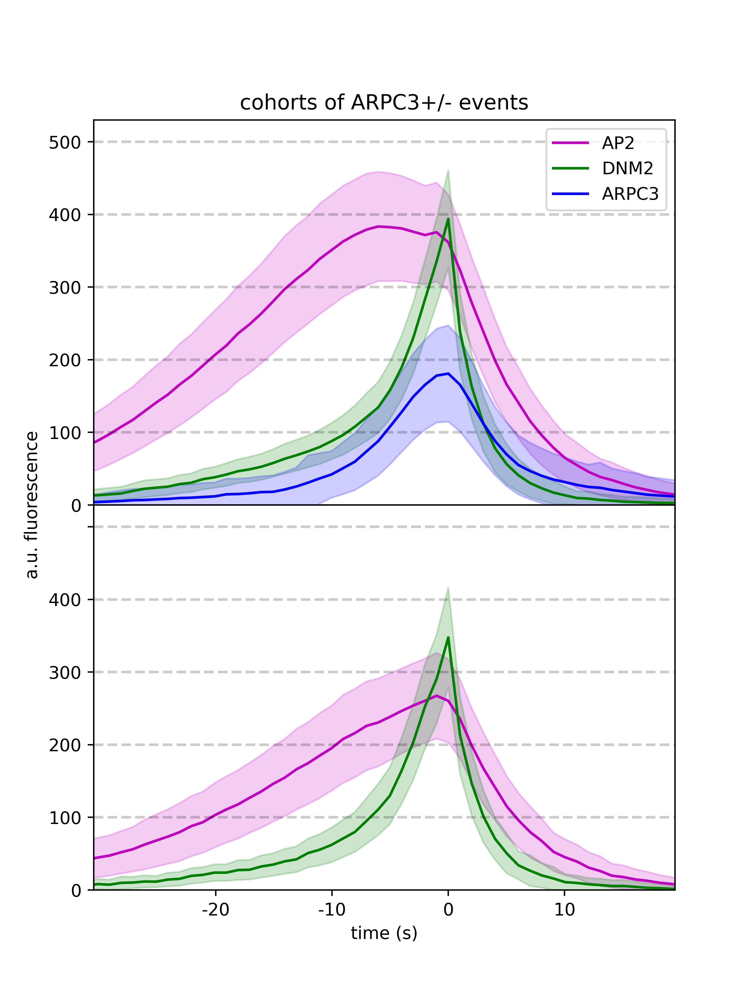

In [42]:
Image(filename=unique_user_saved_outputs+'/plots/all_overlaid_cohorts_stacked_arpc3_no_distance_zeropadding.png', height=500, width=500)

# comparing ARPC3+/- aligned intensities with separations

In [43]:
%%capture

plt.style.use('default')
plt.rcParams['axes.spines.right'] = False

fig, (axes_0, axes_1) = plt.subplots(2, 1, dpi=500, figsize=(6,8), gridspec_kw=dict(height_ratios=[1,1]))
axes_separation_0 = axes_0.twinx()
axes_separation_1 = axes_1.twinx()

cohorts = [[min(ap2_lifetime_arpc3_positive), max(ap2_lifetime_arpc3_positive)]]

_, _, max_dnm2_cohort_indices_0 = display_tracks.plot_separated_cohorts([axes_0, axes_separation_0], 
                                                                         channel_amplitudes_arpc3_positive, 
                                                                         1, 
                                                                         cohorts, 
                                                                         [0, 1, 2], 
                                                                         [3, 4], 
                                                                         ['AP2', 'DNM2', 'ARPC3', 'AP2-DNM2', 'AP2-ARPC3'],
                                                                         ['m', 'g', 'b', 'g', 'b'],
                                                                         line_cutoff_index=[3, 4],
                                                                         line_cutoff_regions=[[], [], [], [[0, 96-10], [96+5, 120]], [[0, 96-10], [96+5, 120]]],
                                                                         horizontal_shift_index=[0, 1, 2, 3, 4], 
                                                                         horizontal_shift=[-96, -96, -96, -96, -96])


cohorts = [[min(ap2_lifetime_arpc3_negative), max(ap2_lifetime_arpc3_negative)]]

offsets, num_in_cohort, max_dnm2_cohort_indices_1 = display_tracks.plot_separated_cohorts([axes_1, axes_separation_1], 
                                                                         channel_amplitudes_arpc3_negative, 
                                                                         1, 
                                                                         cohorts, 
                                                                         [0, 1], 
                                                                         [2], 
                                                                         ['AP2', 'DNM2', 'AP2-DNM2'],
                                                                         ['m', 'g', 'g'],
                                                                         line_cutoff_index=[2],
                                                                         line_cutoff_regions=[[], [], [[0, 92-5], [92+5, 120]]],
                                                                         horizontal_shift_index=[0, 1, 2, 3, 4], 
                                                                         horizontal_shift=[-92, -92, -92, -92, -92])                                                                           


lines_0, labels_0 = axes_0.get_legend_handles_labels()
lines_1, labels_1 = axes_separation_0.get_legend_handles_labels()

axes_0.legend(lines_0+lines_1, labels_0+labels_1, 
            loc='upper right')

y_lines = np.arange(0,600,100)

for i in range(1,len(y_lines)):
    
    axes_0.axhline(y_lines[i], 0, 1, linestyle='--', color='black', alpha=0.2)
    axes_1.axhline(y_lines[i], 0, 1, linestyle='--', color='black', alpha=0.2)

axes_1.set_xlabel('time (s)') 
axes_0.set_xlim([-30, 20]) 
axes_1.set_xlim([-30, 20]) 
axes_0.set_ylim([0,530])
axes_1.set_ylim([0,530])
axes_separation_0.set_ylim([0,0.5])
axes_separation_1.set_ylim([0,0.5])

axes_1.set_yticks([0,100,200,300,400, 500], minor=False)
axes_1.set_yticklabels([0,100,200,300, 400, 500], minor=False)
axes_0.set_yticks([0,100,200,300,400, 500], minor=False)
axes_0.set_yticklabels([0,100,200,300,400, 500], minor=False)

axes_separation_1.set_yticks([0, 0.1, 0.2, 0.3, 0.4], minor=False)
axes_separation_1.set_yticklabels([0, 0.1, 0.2, 0.3, 0.4], minor=False)
axes_separation_0.set_yticks([0, 0.1, 0.2, 0.3, 0.4, 0.5], minor=False)
axes_separation_0.set_yticklabels([0, 0.1, 0.2, 0.3, 0.4, 0.5], minor=False)

plt.setp(axes_0.get_xticklabels(), visible=False)
yticks = axes_1.yaxis.get_major_ticks()
yticks[-1].label1.set_visible(False)
plt.subplots_adjust(hspace=.0)

axes_0.axvline(20, color='black', linewidth=5, linestyle='--')
axes_1.axvline(20, color='black', linewidth=5, linestyle='--')

axes_0.text(-36,0, 'a.u. fluorescence', rotation="vertical", va="center", fontsize=10);
axes_0.text(24,0, 'separation (microns)', rotation=270, va="center", fontsize=10);

axes_1.set_xticks(0.5+np.array([-20, -10, 0, 10]), minor=False)
axes_1.set_xticklabels([-20, -10, 0, 10], minor=False)

axes_0.set_title('cohorts of ARPC3+/- events')

plt.savefig(unique_user_saved_outputs+'/plots/all_overlaid_cohorts_stacked_arpc3_zeropadding.png')

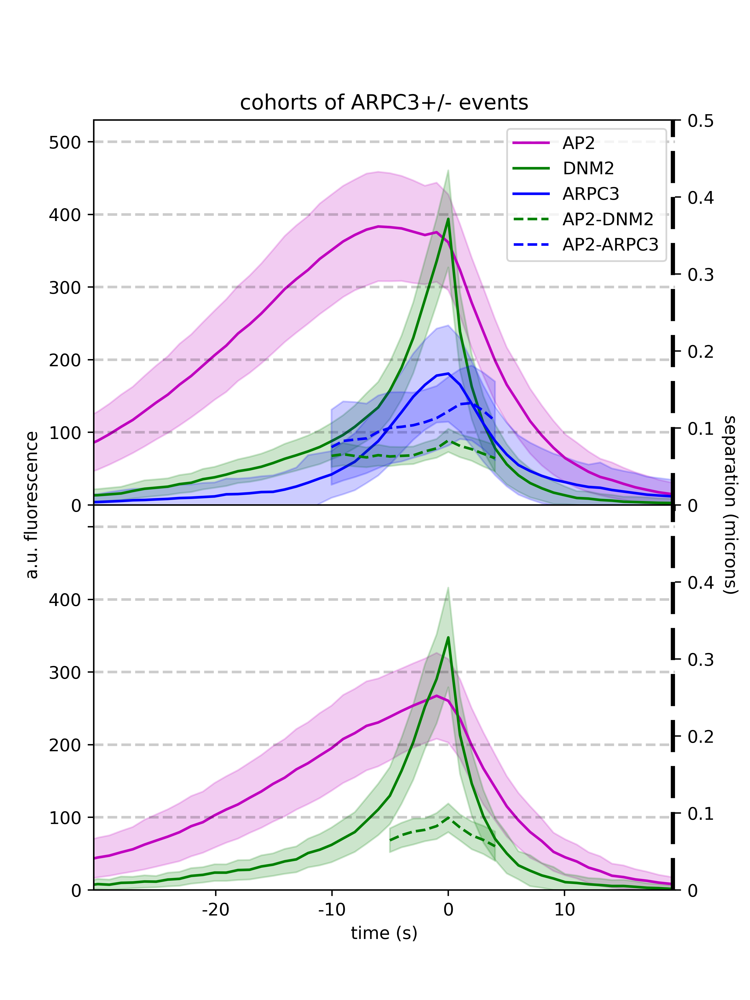

In [44]:
Image(filename=unique_user_saved_outputs+'/plots/all_overlaid_cohorts_stacked_arpc3_zeropadding.png', height=500, width=500)